![header](images/dcheader.png)

# **UC1 Final Review Meeting Demo**

### *Imports*

In [1]:
import earthnet_minicuber as emc
import earthnet as entk
import s3fs
import rasterio
import dask
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as clr
import datetime
import folium
import xarray as xr
from hops import hdfs
import os
os.environ["PC_SDK_SUBSCRIPTION_KEY"] = # YOUR PLANETARY COMPUTER KEY HERE

2024-02-21 14:20:48,325 INFO: NumExpr defaulting to 8 threads.
2024-02-21 14:20:55,191 INFO: generated new fontManager


## User defines the region of interest and minicube properties
In this case we are going to select Baidoa (43.598946, 3.087414), a region of interest for Use Case 2. We create a larger than usual minicube of 512 by 512 pixels for plotting.

In [2]:
BASESPECS = dict(
    lon_lat = (43.598946, 3.087414), # center pixel
    xy_shape = (512, 512), # width, height of cutout around center pixel
    resolution = 10, # in meters.. will use this together with grid of primary provider..
    time_interval = "2021-01-01/2021-02-28",
    providers = [
        dict(
            name = "s2",
            kwargs = dict(
                bands = ["B02", "B03", "B04", "B05", "B06", "B07", "B8A"],
                best_orbit_filter = True,
                brdf_correction = True,
                cloud_mask = True,
                aws_bucket = "planetary_computer",
            )
        ),
        dict(
            name = "s1",
            kwargs = dict(
                bands = ["vv", "vh","mask"],
                speckle_filter = True,
                speckle_filter_kwargs = {"type": "lee", "size": 9},
                aws_bucket = "planetary_computer",
            )
        ),
        dict(
            name = "era5esdl",
            kwargs = dict(
                bands = ['e', 'pet', 'pev', 'ssrd', 't2m', 't2mmax', 't2mmin','tp'],
            ),
        ),
        dict(
            name = "ndviclim",
            kwargs = dict(
                bands = ["mean", "std"],
            ),
        ),
        dict(
            name = "srtm",
            kwargs = dict(
                bands = ["dem"],
            ),
        ),
        dict(
            name = "esawc",
            kwargs = dict(
                bands = ["lc"],
                aws_bucket = "planetary_computer",
            ),
        ),
    ],
)

In [3]:
LOCATIONS = dict(
    baidoa = (43.598946, 3.087414),
    kribi = (9.920089, 2.936115),
)
def specs(loc):
    return BASESPECS | dict(lon_lat = LOCATIONS[loc])

# Creating a Minicube for a location

In [55]:
minicube = emc.load_minicube(specs("kribi"), compute = True)

Loading Sentinel2 for 2021-01-01/2021-01-31
Loading Sentinel1 for 2021-01-01/2021-01-31
Loading ERA5_ESDL for 2021-01-01/2021-01-31
Loading Sentinel2 for 2021-02-01/2021-02-28
Loading Sentinel1 for 2021-02-01/2021-02-28
Loading ERA5_ESDL for 2021-02-01/2021-02-28
Loading NDVIClim
Loading SRTM
Loading ESAWorldcover


In [56]:
minicube

<xarray.Dataset> Size: 1GB
Dimensions:        (time: 59, lon: 512, lat: 512, time_clim: 12)
Coordinates:
  * time           (time) datetime64[ns] 472B 2021-01-01 ... 2021-02-28
  * lon            (lon) float64 4kB 9.897 9.897 9.897 ... 9.943 9.943 9.943
  * lat            (lat) float64 4kB 2.959 2.959 2.959 ... 2.913 2.913 2.913
    angle          <U7 28B 'Zenith'
  * time_clim      (time_clim) datetime64[ns] 96B 1970-01-15 ... 1970-12-15
Data variables: (12/25)
    s2_SCL         (time, lat, lon) float64 124MB nan nan nan ... nan nan nan
    s2_mask        (time, lat, lon) float64 124MB nan nan nan ... nan nan nan
    s2_avail       (time) float32 236B nan nan nan nan nan ... 1.0 nan nan nan
    s2_B02         (time, lat, lon) float64 124MB nan nan nan ... nan nan nan
    s2_B03         (time, lat, lon) float64 124MB nan nan nan ... nan nan nan
    s2_B04         (time, lat, lon) float64 124MB nan nan nan ... nan nan nan
    ...             ...
    era5_t2mmin    (time) float32 236B 299.0 298.7 298.8 ... 298.7 299.7 300.0
    era5_tp        (time) float32 236B 3.5 3.671 1.98 ... 3.435 1.363 1.799
    ndviclim_mean  (time_clim, lat, lon) float64 25MB 0.0574 0.06009 ... 0.5196
    ndviclim_std   (time_clim, lat, lon) float64 25MB 0.03886 0.03959 ... 0.1663
    srtm_dem       (lat, lon) float64 2MB 0.0 0.0 0.0 0.0 ... 57.9 59.58 61.25
    esawc_lc       (lat, lon) float32 1MB 80.0 80.0 80.0 80.0 ... 10.0 10.0 10.0
Attributes:
    history:  Created on 2024-02-20 20:12:55.324383 with the earthnet-minicub...

# Saving the Minicube as NetCDF to HopsWorks datasets

In [ ]:
if os.path.isfile("minicube.nc")
    os.remove("minicube.nc")
minicube.to_netcdf("minicube.nc")

In [59]:
project_root_path = hdfs.project_path()
minicube_path = project_root_path + "uc1_Training_Datasets"
print(f"Minicube is saved to HopsWorks datasets under path {minicube_path}")
hdfs.copy_to_hdfs("minicube.nc", minicube_path, overwrite = True)

Minicube is saved to HopsWorks datasets under path hdfs://rpc.namenode.service.consul:8020/Projects/uc1/uc1_Training_Datasets


# Loading MiniCube from HopsWorks datasets

In [5]:
project_root_path = hdfs.project_path()
minicube_path = project_root_path + "uc1_Training_Datasets"
print('Minicube will be loaded from '+minicube_path)
minicube_path_local = hdfs.copy_to_local(minicube_path+"/minicube.nc", overwrite=True)

Minicube will be loaded from hdfs://rpc.namenode.service.consul:8020/Projects/uc1/uc1_Training_Datasets


In [4]:
minicube_path_local = "minicube.nc"
minicube = xr.open_dataset(minicube_path_local)

In [5]:
minicube

<xarray.Dataset> Size: 1GB
Dimensions:        (time: 59, lon: 512, lat: 512, time_clim: 12)
Coordinates:
  * time           (time) datetime64[ns] 472B 2021-01-01 ... 2021-02-28
  * lon            (lon) float64 4kB 9.897 9.897 9.897 ... 9.943 9.943 9.943
  * lat            (lat) float64 4kB 2.959 2.959 2.959 ... 2.913 2.913 2.913
    angle          <U6 24B ...
  * time_clim      (time_clim) datetime64[ns] 96B 1970-01-15 ... 1970-12-15
Data variables: (12/25)
    s2_SCL         (time, lat, lon) float64 124MB ...
    s2_mask        (time, lat, lon) float64 124MB ...
    s2_avail       (time) float32 236B ...
    s2_B02         (time, lat, lon) float64 124MB ...
    s2_B03         (time, lat, lon) float64 124MB ...
    s2_B04         (time, lat, lon) float64 124MB ...
    ...             ...
    era5_t2mmin    (time) float32 236B ...
    era5_tp        (time) float32 236B ...
    ndviclim_mean  (time_clim, lat, lon) float64 25MB ...
    ndviclim_std   (time_clim, lat, lon) float64 25MB ...
    srtm_dem       (lat, lon) float64 2MB ...
    esawc_lc       (lat, lon) float32 1MB ...
Attributes:
    history:  Created on 2024-02-20 20:12:55.324383 with the earthnet-minicub...

# Plots

### Raw Image Time Series

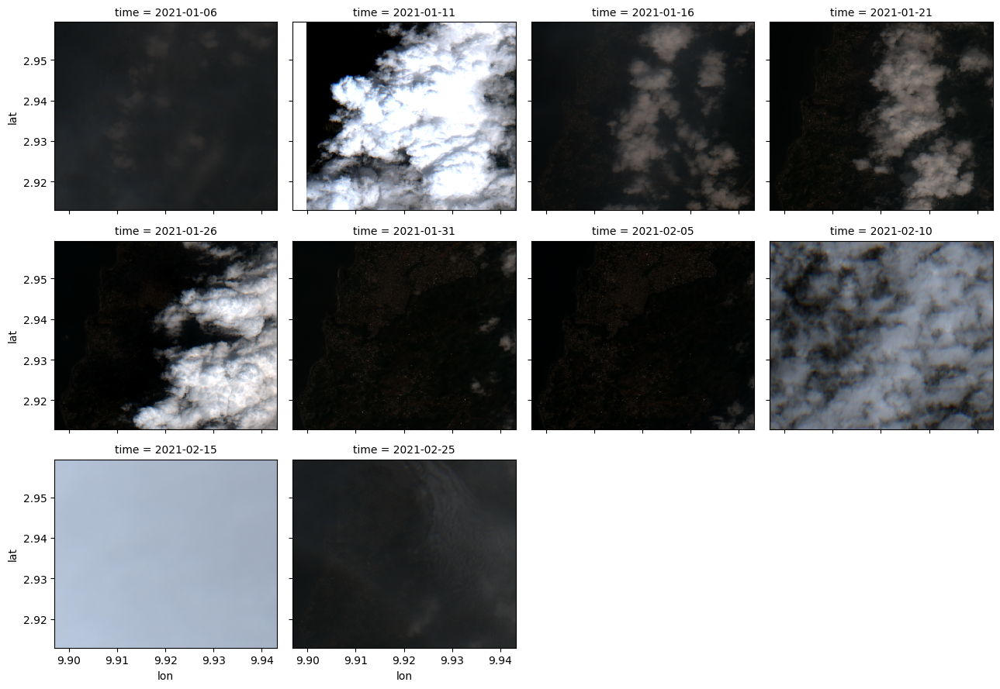

In [9]:
rgb = minicube[["s2_B04", "s2_B03", "s2_B02"]].to_array("band").sel(time = minicube.s2_avail == 1)
rgb.plot.imshow(rgb = "band", col = "time", col_wrap = 5, robust = True)
plt.show()

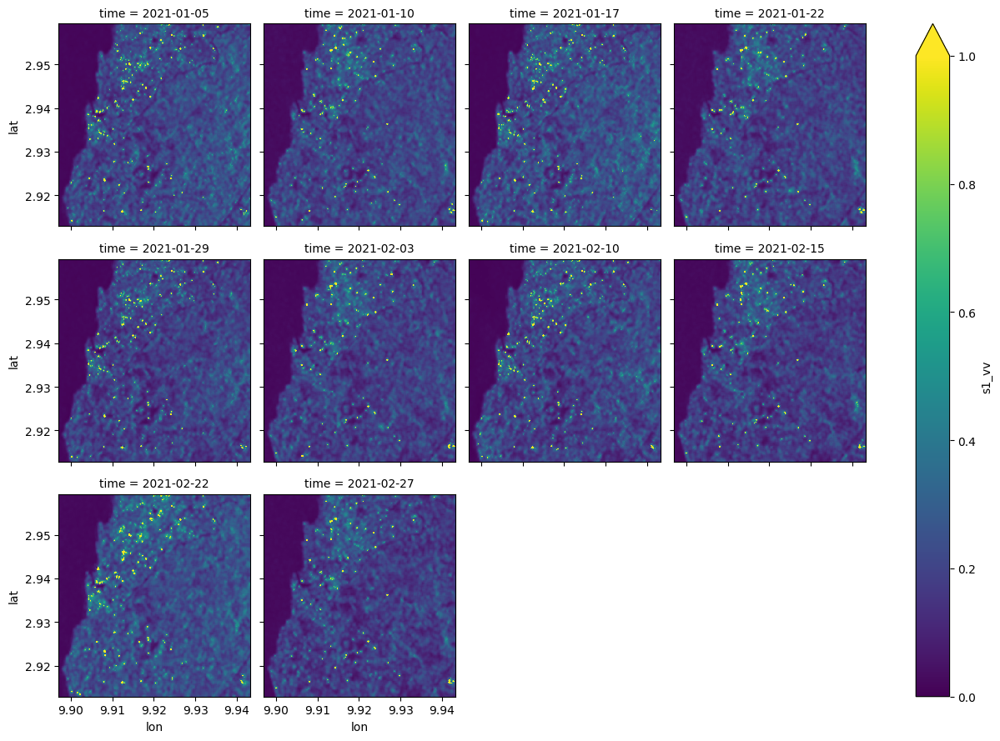

In [13]:
minicube["s1_vv"].sel(time = minicube.s1_avail == 1).plot.imshow(col = "time", col_wrap = 5, vmin = 0, vmax = 1)
plt.show()

In [6]:
cmap_veg = clr.LinearSegmentedColormap.from_list('veg', ['#ffffe5','#f7fcb9','#d9f0a3','#addd8e','#78c679','#41ab5d','#238443','#006837','#004529'])

def map(minicube):
    x_min, x_max, y_min, y_max = minicube.lon[0].values, minicube.lon[-1].values, minicube.lat[-1].values, minicube.lat[0].values
    # Create map
    interactive_map = folium.Map(
        location=((y_min+y_max)/2, (x_min+x_max)/2),
        zoom_start= min(int((np.log(1000 / (x_max-x_min)) / np.log(2))), int((np.log(1000 / (y_max-y_min)) / np.log(2)))),
        tiles="http://mt1.google.com/vt/lyrs=y&z={z}&x={x}&y={y}",
        attr="Google",
        prefer_canvas=True,
    )
    
    folium.TileLayer('openstreetmap', show=False).add_to(interactive_map)
    
    # Create bounding box coordinates to overlay on map
    line_segments = [
        (y_min, x_min),
        (y_min, x_max),
        (y_max, x_max),
        (y_max, x_min),
        (y_min, x_min),
    ]

    # Add bounding box as an overlay
    interactive_map.add_child(
        folium.features.PolyLine(locations=line_segments, color="red", opacity=0.8)
    )
    #folium.PolyLine(locations=line_segments, color="red", opacity=0.8).add_to(interactive_map)
    
    return interactive_map

In [7]:
# PARAMS
S2_t = 4
S1_t = 4

rgb = minicube[["s2_B04", "s2_B03", "s2_B02"]].to_array("band").sel(time = minicube.s2_avail == 1).isel(time=S2_t).to_numpy()
rgb = np.nan_to_num(rgb, nan=0.0)
rgb = np.swapaxes(rgb, 0, 2)
rgb = np.swapaxes(rgb, 0, 1)

srtm = minicube.srtm_dem.to_numpy()
srtm = (srtm-np.nanmin(srtm))/np.nanmax(srtm) #minmax scale
srtm = np.nan_to_num(srtm, nan=np.nanmean(srtm))

mask = (minicube["s2_mask"]).sel(time = minicube.s2_avail == 1).isel(time=S2_t).where(lambda x: x>0).to_numpy()
mask = np.nan_to_num(mask, nan=0.0)

s1 = (4 * minicube.s1_vh / (minicube.s1_vh + minicube.s1_vv)).sel(time = minicube.s1_avail == 1).isel(time=S1_t).to_numpy()
s1 = np.nan_to_num(s1, nan=0.0)

lc = (minicube.esawc_lc).to_numpy()
lc = np.nan_to_num(lc, nan=0.0)

ndvi_clims=[]
for i in range(12):
    clim = minicube.ndviclim_mean.isel(time_clim=i).to_numpy()
    clim = np.nan_to_num(clim, nan=0.0)
    month = datetime.datetime.strptime(str(i+1), "%m").strftime("%b")
    ndvi_clims.append({"month": month, "ndvi_mean": clim})

### Sentinel 2 RGB

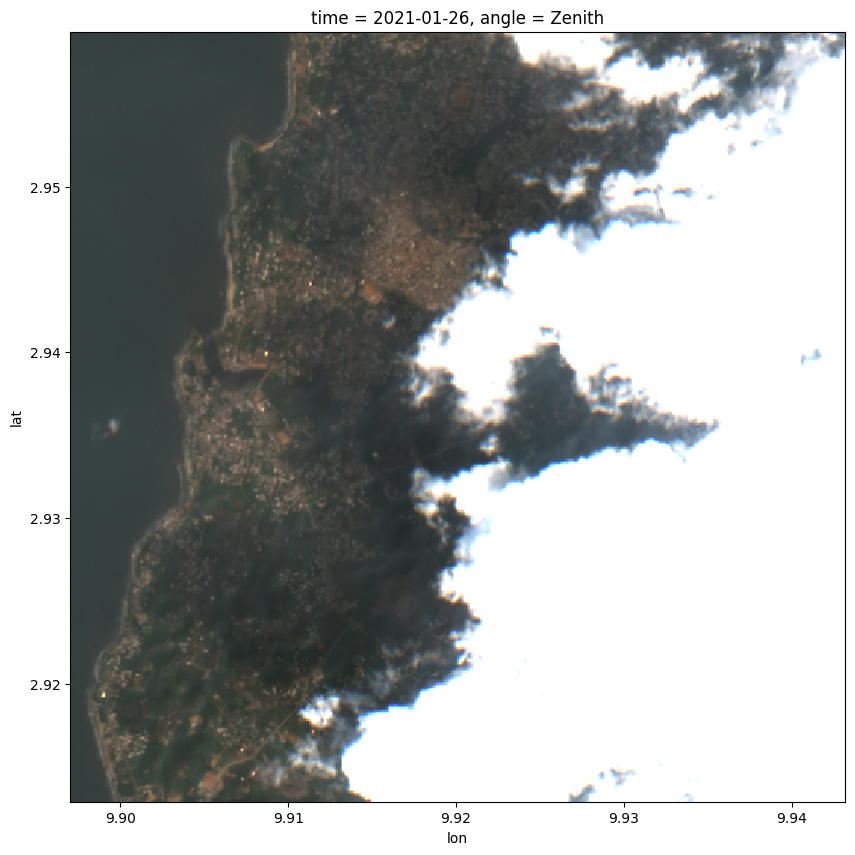

In [32]:
minicube[["s2_B04", "s2_B03", "s2_B02"]].to_array("band").sel(time = minicube.s2_avail == 1).isel(time=S2_t).plot.imshow(rgb="band", figsize = (10, 10),vmin = 0.0, vmax = 0.3)
plt.show()

### NDVI

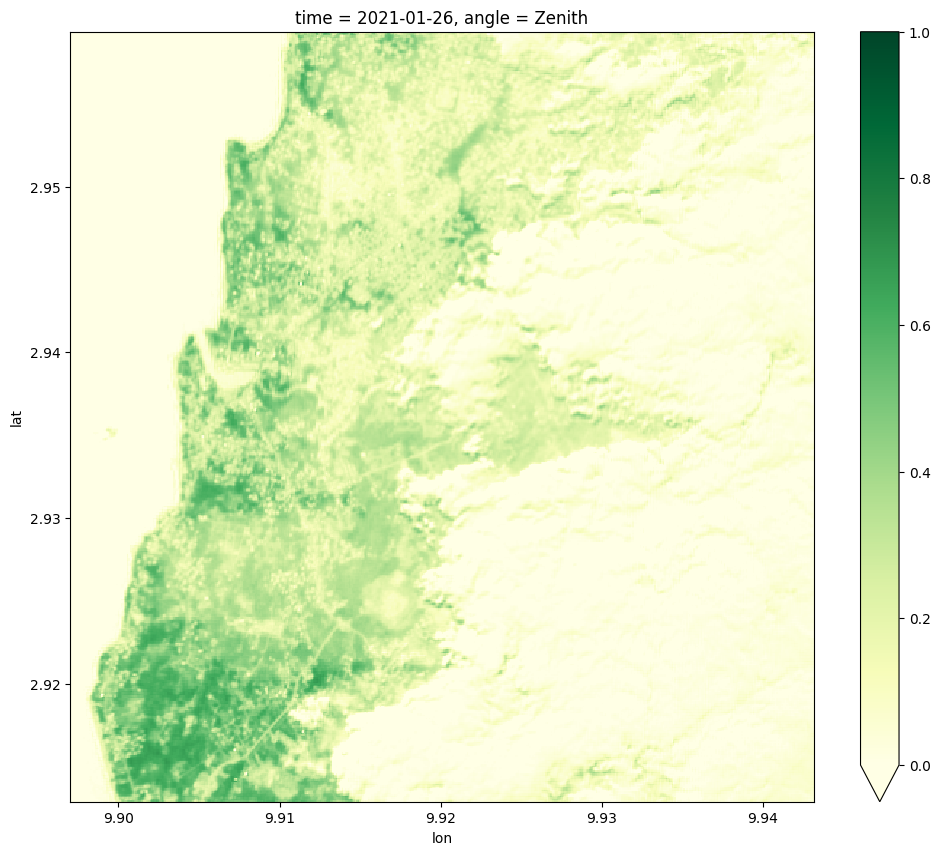

In [25]:
ndvi = (minicube.s2_B8A-minicube.s2_B04)/(minicube.s2_B8A+minicube.s2_B04)
ndvi.sel(time = minicube.s2_avail == 1).isel(time=S2_t).plot.imshow(vmin = 0, vmax = 1,cmap = cmap_veg, figsize = (12, 10))
plt.show()

### NDVI Anomaly (Landsat Clim - Sentinel2)

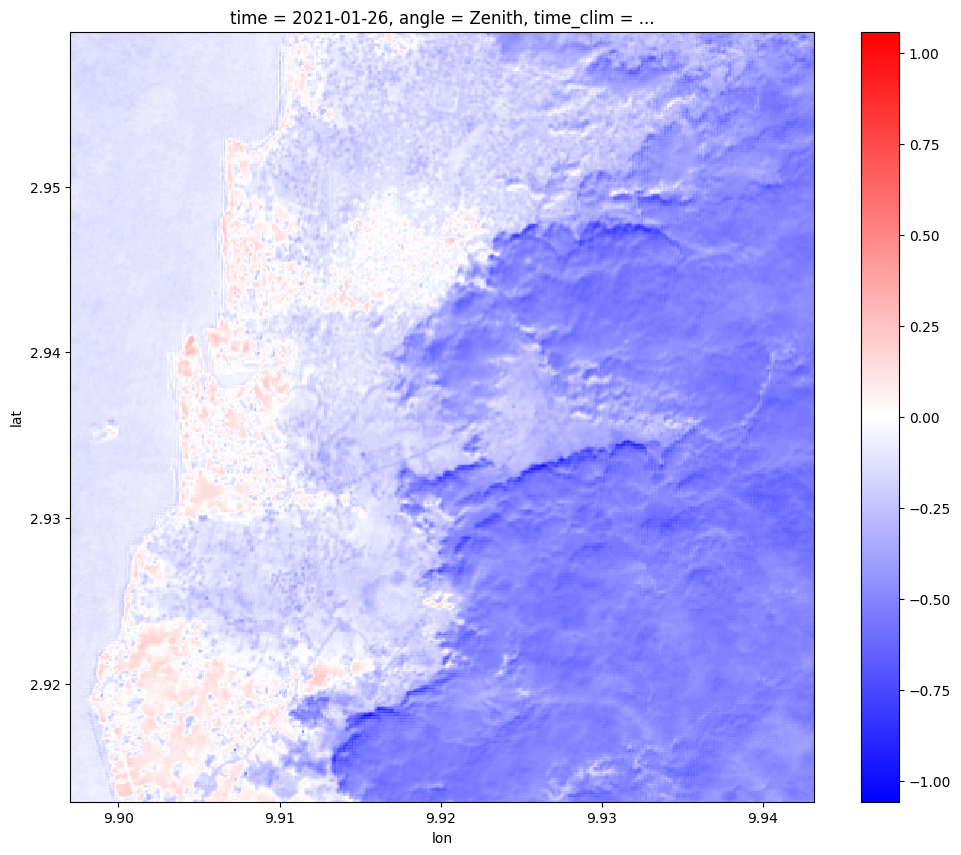

In [26]:
(ndvi.sel(time = minicube.s2_avail == 1).isel(time=S2_t)-minicube.ndviclim_mean.isel(time_clim = 0)).plot.imshow(cmap = 'bwr', figsize = (12, 10))
plt.show()

### Temperature

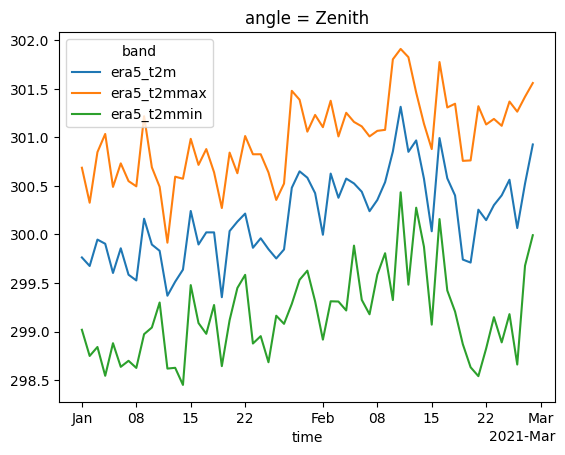

In [27]:
minicube[['era5_t2m', 'era5_t2mmax', 'era5_t2mmin']].to_array("band").plot(hue = "band")
plt.show()

### Meteorology

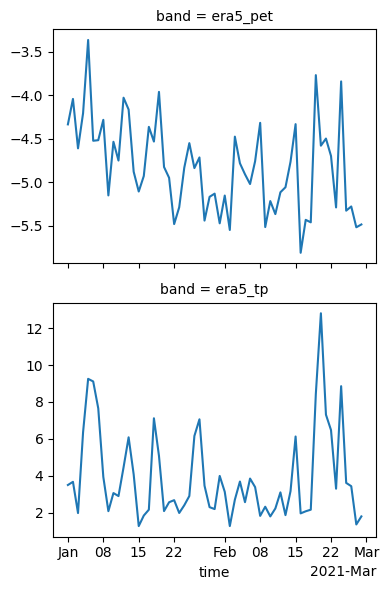

In [65]:
minicube[[f'era5_{v}' for v in ['pet', 'tp']]].to_array("band").plot(row = "band", sharey = False)
plt.show()

### Cloud Mask

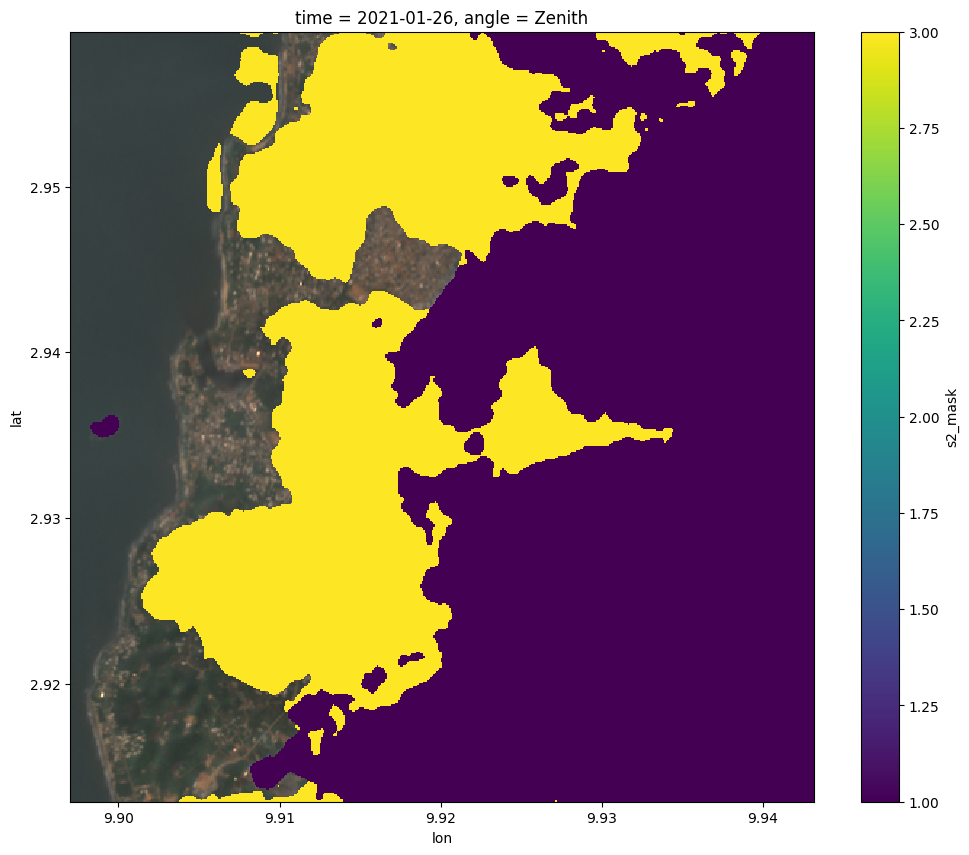

In [31]:
(minicube[["s2_B04", "s2_B03", "s2_B02"]].to_array("band").sel(time = minicube.s2_avail == 1).isel(time=S2_t)).plot.imshow(rgb="band", figsize=(12,10),vmin = 0.0, vmax = 0.3)
minicube["s2_mask"].sel(time = minicube.s2_avail == 1).isel(time=S2_t).where(lambda x: x>0).plot.imshow(ax = plt.gca())
plt.show()

### Sentinel 1 Veg Index

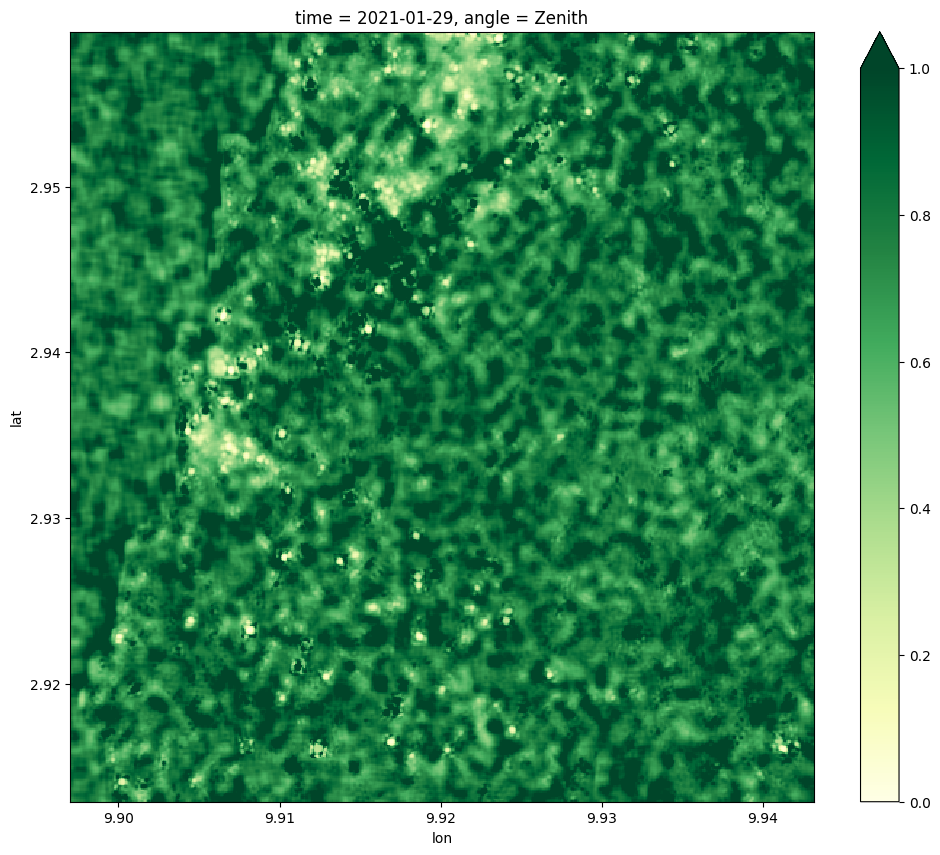

In [30]:
(4 * minicube.s1_vh / (minicube.s1_vh + minicube.s1_vv)).sel(time = minicube.s1_avail == 1).isel(time=S1_t).plot.imshow(vmin = 0, vmax = 1,cmap = cmap_veg, figsize = (12, 10))
plt.show()

### NDVI climatology

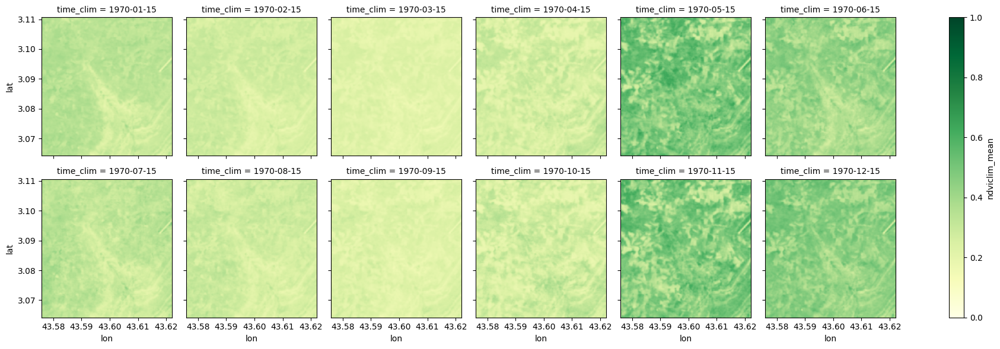

In [28]:
minicube.ndviclim_mean.plot.imshow(col = "time_clim", col_wrap = 6, cmap = cmap_veg, vmin = 0, vmax = 1)
plt.show()

### ESA World Cover

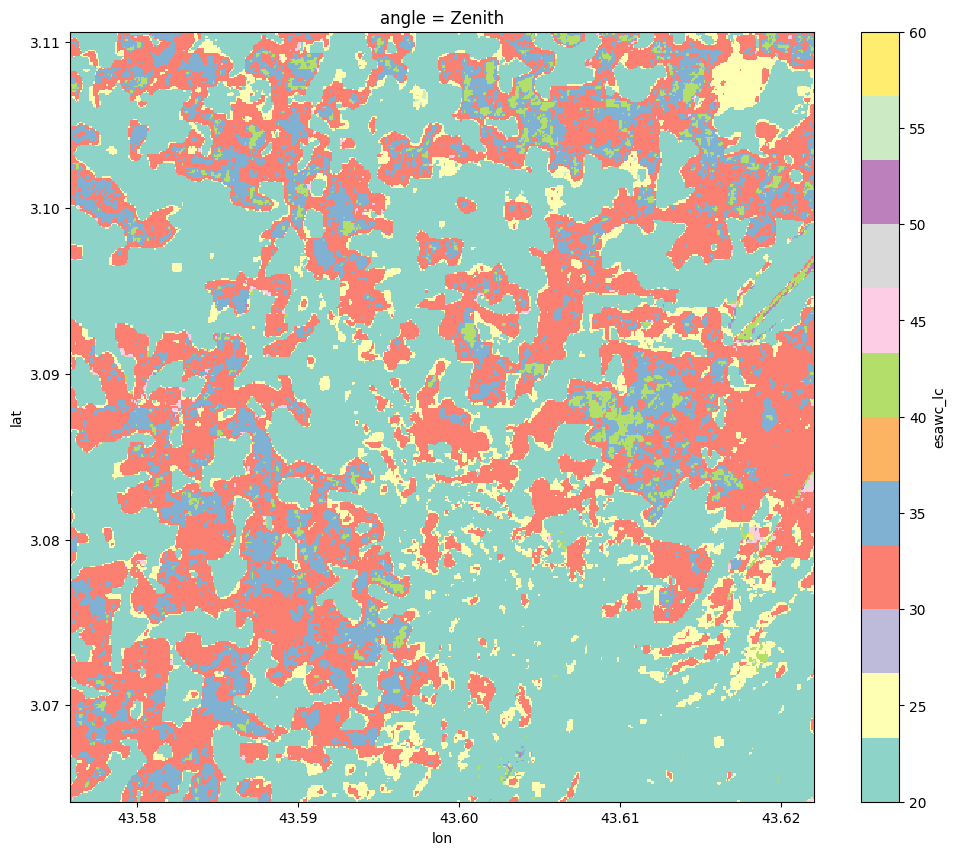

In [29]:
minicube.esawc_lc.plot(cmap="Set3", figsize = (12, 10))
plt.show()

1 - Water
2 - Trees
3 - Grass
4 - Flooded vegetation
5 - Crops
6 - Scrub/shrub
7 - Built Area
8 - Bare ground
9 - Snow/Ice
10 - Clouds

### Digital Elevation Map (SRTM v4.1)

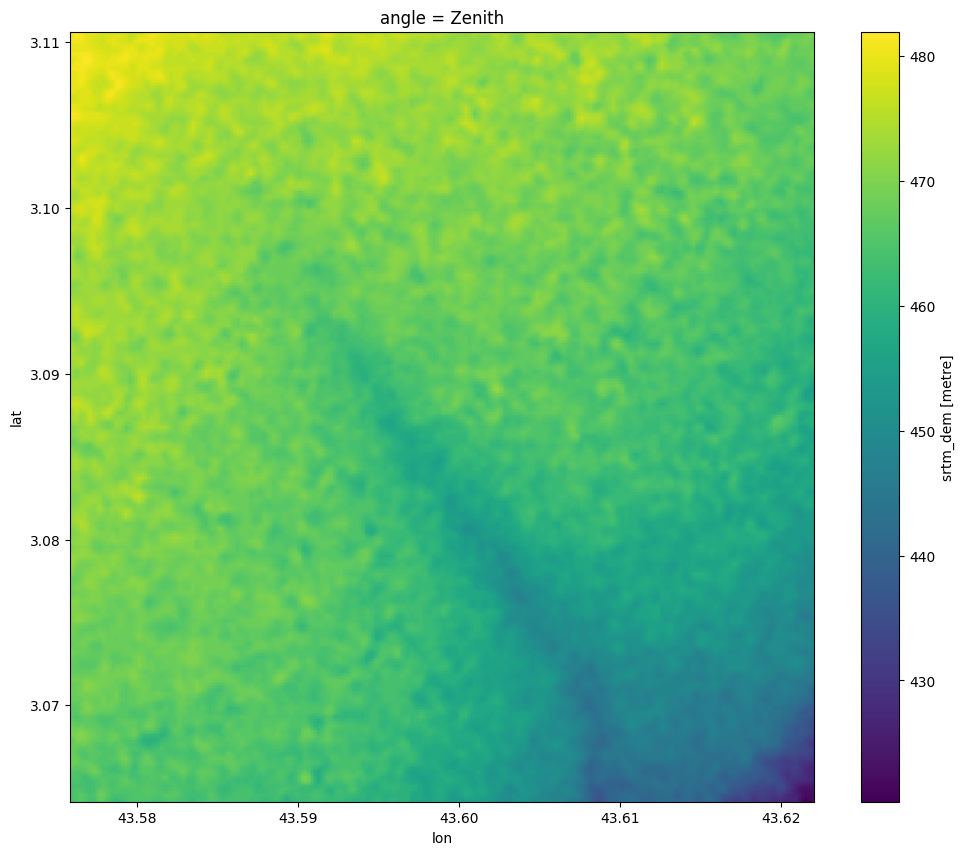

In [30]:
minicube.srtm_dem.plot.imshow(figsize = (12, 10))
plt.show()

# Folium Interactive Map


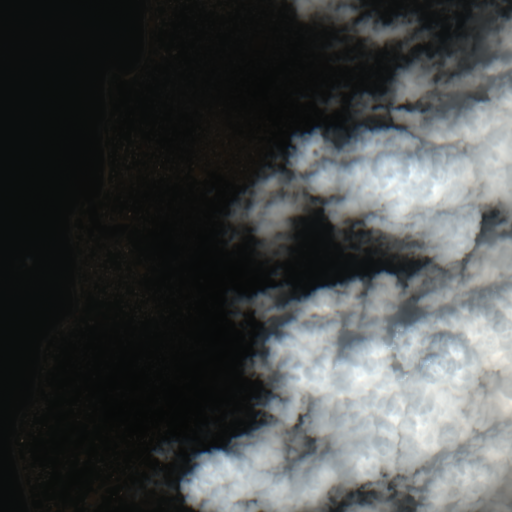
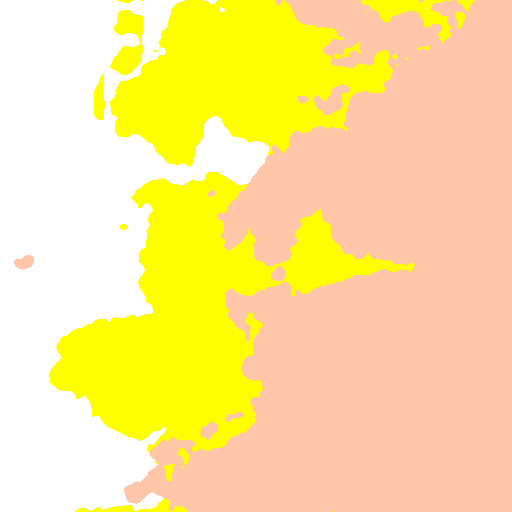
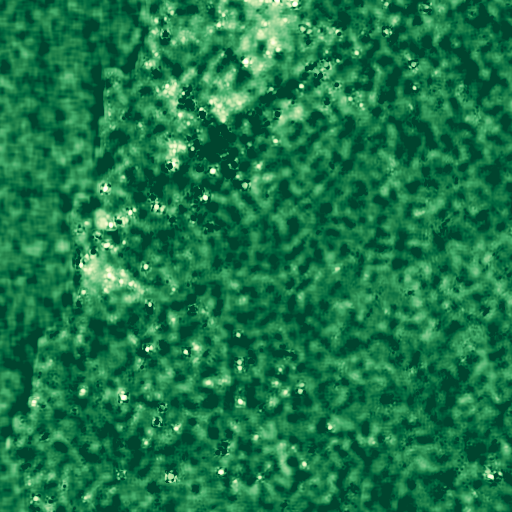
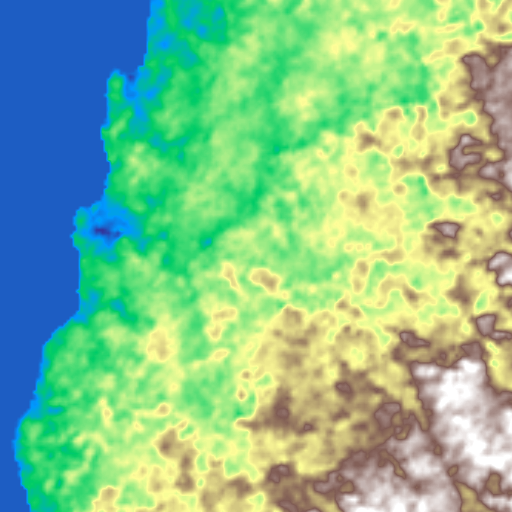
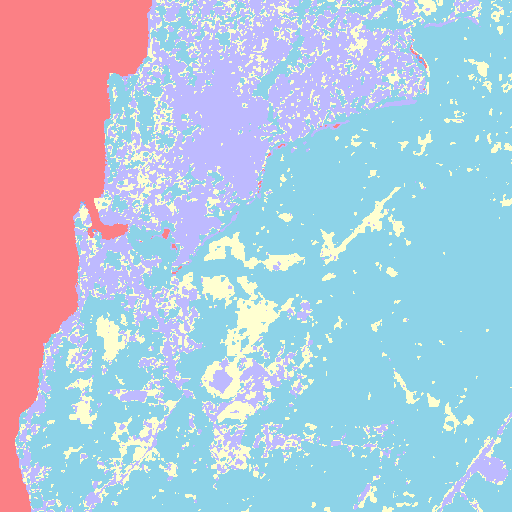
...
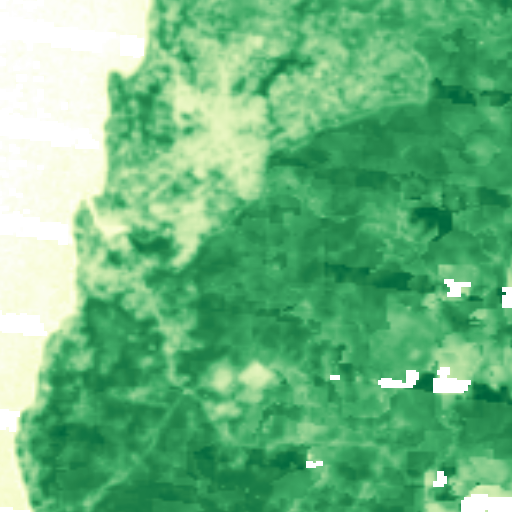
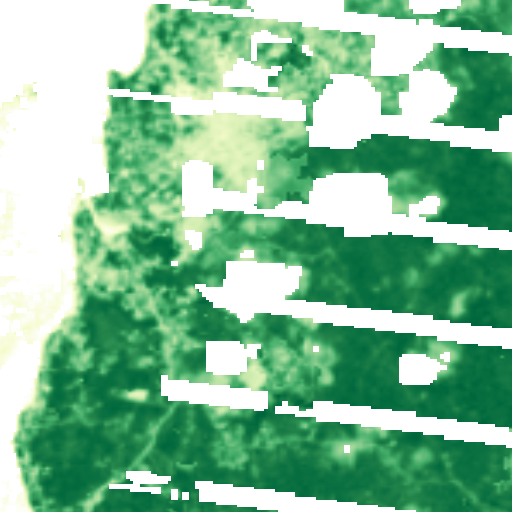
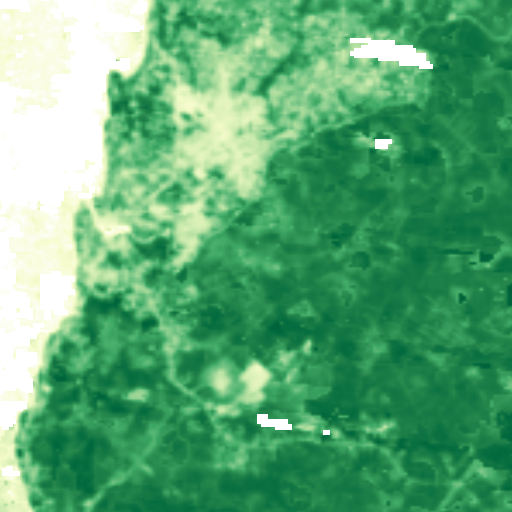
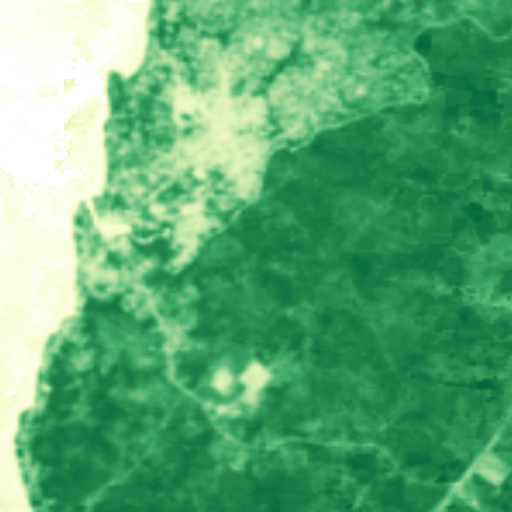
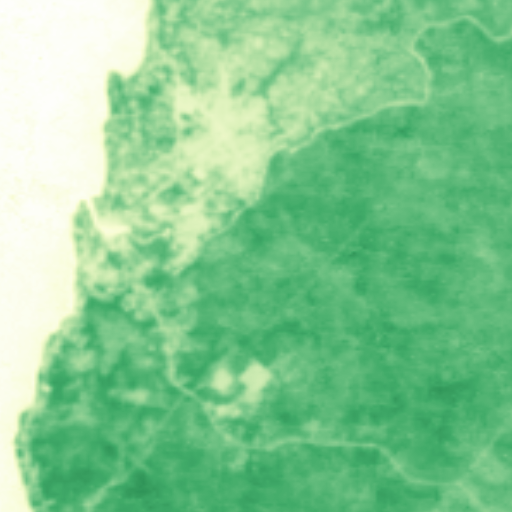

In [8]:
interactive_map = map(minicube)

rgb_brightness_scaling=30
bounds = [[float(minicube.lat[-1].values), float(minicube.lon[0].values)], [float(minicube.lat[0].values), float(minicube.lon[-1].values)]]

# Add RGB layer
folium.raster_layers.ImageOverlay(
    image=rgb*rgb_brightness_scaling,
    bounds=bounds,
    mercator_project=True,
    name="Sentinel 2 RGB",
    opacity=0.95,
).add_to(interactive_map)

# Add cloud layer
folium.raster_layers.ImageOverlay(
    image=mask,
    bounds=bounds,
    mercator_project=True,
    name="S2 Mask",
    colormap = lambda x: (1, x/10, -x/2, x),
).add_to(interactive_map)

# Add S1
folium.raster_layers.ImageOverlay(
    image=s1,
    bounds=bounds,
    mercator_project=True,
    name="S1",
    opacity=1,
    show=False,
    colormap = cmap_veg,
).add_to(interactive_map)

# Add SRTM
folium.raster_layers.ImageOverlay(
    image=srtm,
    bounds=bounds,
    mercator_project=True,
    name="SRTM",
    opacity=0.75,
    show=False,
    colormap = plt.get_cmap("terrain"),
).add_to(interactive_map)

# Add ESA-WC
folium.raster_layers.ImageOverlay(
    image=lc/255,
    bounds=bounds,
    mercator_project=True,
    name="ESA WorldCover",
    opacity=0.8,
    show=False,
    colormap = plt.get_cmap("Set3"),
).add_to(interactive_map)

# Add NDVI Climatology
for clim in ndvi_clims:
    folium.raster_layers.ImageOverlay(
        image=clim['ndvi_mean'],
        bounds=bounds,
        mercator_project=True,
        name=f"NDVI {clim['month']}",
        opacity=0.9,
        show=False,
        colormap = cmap_veg,
    ).add_to(interactive_map)
    
folium.map.LayerControl(position='topright', collapsed=False, autoZIndex=True).add_to(interactive_map)

interactive_map

## Some example minicubes of the EarthNet2023 dataset (Cycle II final dataset)

You can of course choose whatever minicubes you want (eg. look for minicube IDs on [this map](https://www.earthnet.tech/earthnet2023_map.html)), but we also preselected a few that might be interesting:

`"36PZQ6711", "38PQS3309", "38PQS6426", "39NUJ4301", "38NNK3626", "39PVN4533"`

## [Explorer Map](https://www.earthnet.tech/earthnet2023_map.html)

In [9]:
from IPython.display import IFrame

IFrame(src="https://www.earthnet.tech/earthnet2023_map.html", width=700, height=600)

## Loading one Minicube

In [10]:
# Loading one Minicube
minicube = entk.load_minicube(dataset = "earthnet2023", split = "test", id = "36PZQ6711")

Searching for 36PZQ6711...
Found 36PZQ6711.


In [11]:
minicube

<xarray.Dataset> Size: 2GB
Dimensions:               (time: 2191, lon: 128, lat: 128, time_clim: 12)
Coordinates:
  * time                  (time) datetime64[ns] 18kB 2016-01-02 ... 2021-12-31
  * lon                   (lon) float64 1kB 36.5 36.5 36.5 ... 36.51 36.51 36.51
  * lat                   (lat) float64 1kB 8.903 8.903 8.903 ... 8.891 8.891
  * time_clim             (time_clim) datetime64[ns] 96B 1970-01-15 ... 1970-...
Data variables: (12/72)
    s2_avail              (time) float32 9kB ...
    s2_B02                (time, lat, lon) float32 144MB ...
    s2_B03                (time, lat, lon) float32 144MB ...
    s2_B04                (time, lat, lon) float32 144MB ...
    s2_B05                (time, lat, lon) float32 144MB ...
    s2_B06                (time, lat, lon) float32 144MB ...
    ...                    ...
    sg_sand_top_mean      (lat, lon) float32 66kB ...
    sg_sand_sub_mean      (lat, lon) float32 66kB ...
    sg_silt_top_mean      (lat, lon) float32 66kB ...
    sg_silt_sub_mean      (lat, lon) float32 66kB ...
    sg_soc_top_mean       (lat, lon) float32 66kB ...
    sg_soc_sub_mean       (lat, lon) float32 66kB ...
Attributes:
    dataset_name:        EarthNet2023 - Africa
    dataset_name_short:  en23
    dataset_version:     v1.0
    description:         This is a minicube from the EarthNet2023 - Africa da...
    license:             \nLicense\nEarthNet2023 - Africa is shared under CC-...
    provided_by:         Max-Planck-Institute for Biogeochemistry

## Plotting

We are gonne plot some stuff now:)

In [37]:
rgb = minicube[["s2_B04", "s2_B03", "s2_B02"]].to_array("band")
masked_rgb = rgb.where(minicube.s2_mask < 1, np.NaN).sel(time = minicube.s2_avail == 1)
seasonal_rgb = masked_rgb.resample(time="QS-DEC", skipna = True).median()

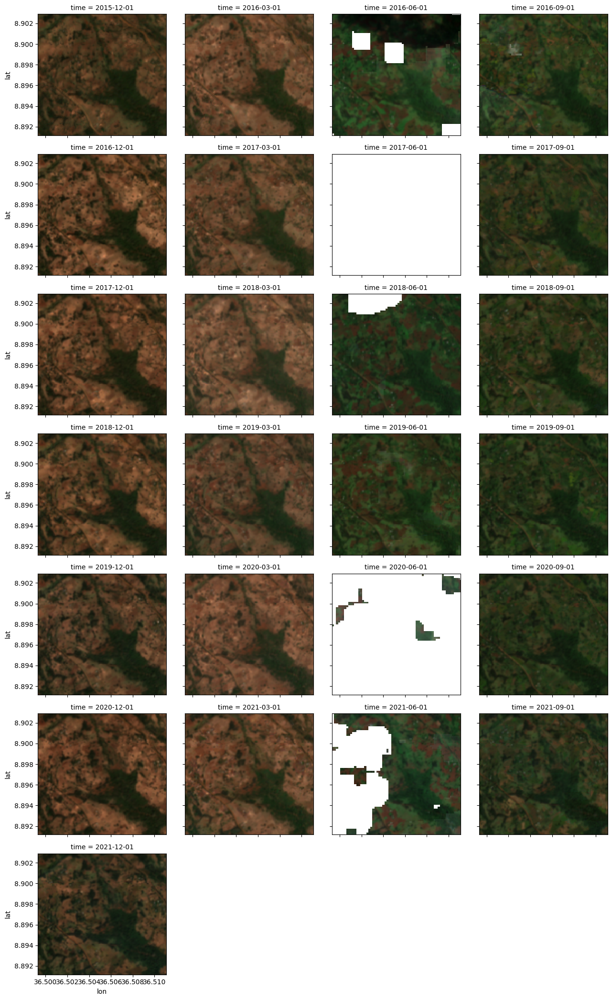

In [38]:
seasonal_rgb.plot.imshow(rgb = "band", col = "time", col_wrap = 4, vmin = 0.0, vmax = 0.3)
plt.show()

## Proxy for Vegetation

As a proxy for the vegetation we use the Normalized Difference Vegetation Index NDVI. It leverages the distinct reflective properties of sunlight in the red and near-infrared wavelengths of natural vegetation.

The NDVI is the target against which we are going to optimize.

In [39]:
red = minicube.s2_B04
nir = minicube.s2_B8A
ndvi = (nir - red) / (nir + red + 1e-8)
masked_ndvi = ndvi.where(minicube.s2_mask < 1, np.NaN)
seasonal_ndvi = masked_ndvi.resample(time="QS-DEC", skipna = True).median()

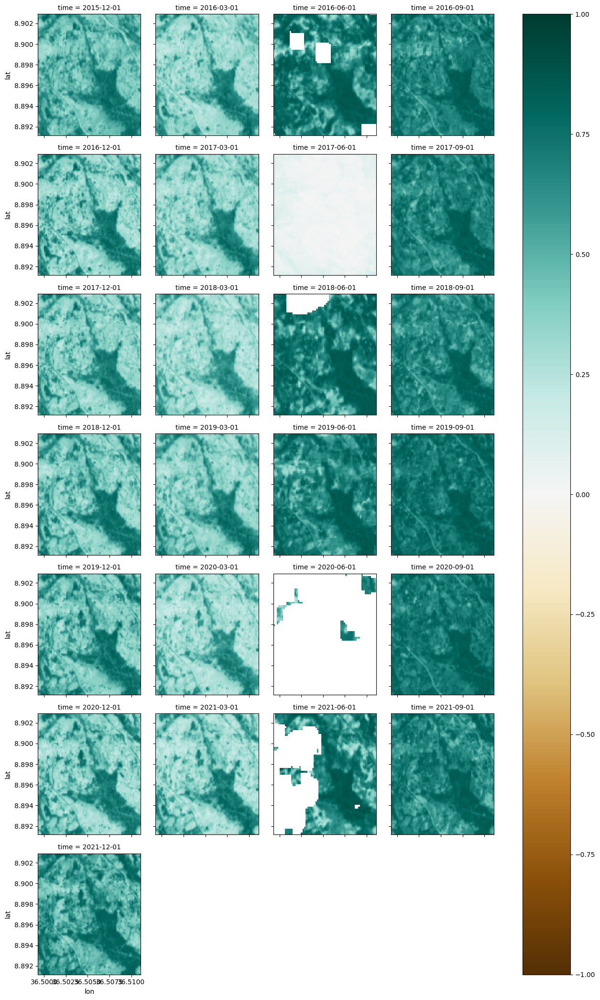

In [40]:
seasonal_ndvi.plot.imshow(col = "time", col_wrap = 4, vmin = -1.0, vmax = 1.0, cmap = "BrBG")
plt.show()

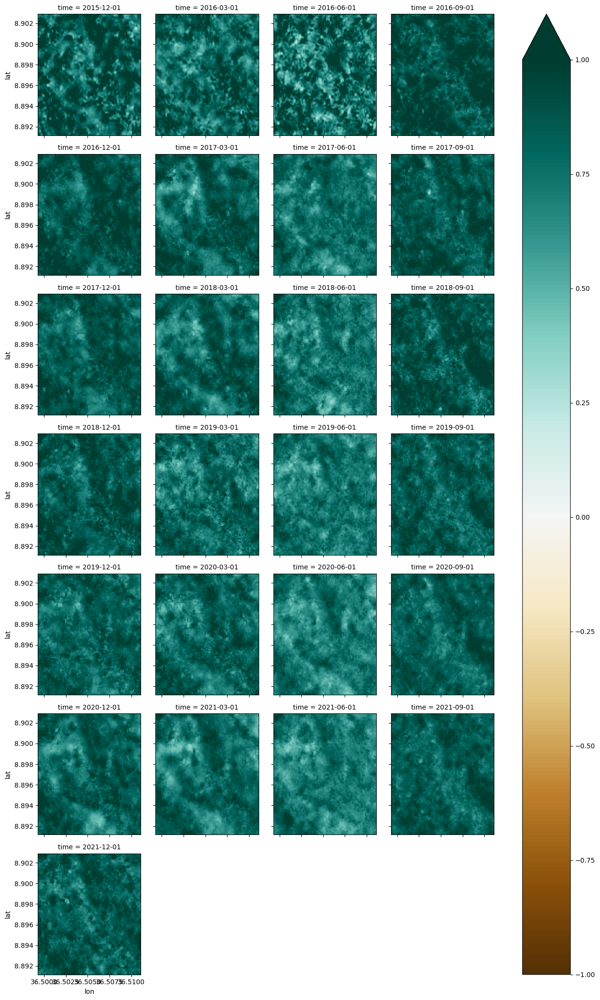

In [43]:
s1_veg_index = 4 * minicube.s1_vh / (minicube.s1_vh + minicube.s1_vv)
seasonal_s1_veg_index = s1_veg_index.resample(time="QS-DEC", skipna = True).median()

seasonal_s1_veg_index.plot.imshow(col = "time", col_wrap = 4, vmin = -1.0, vmax = 1.0, cmap = "BrBG")
plt.show()